# Introduction
Accurate bandgap prediction is crucial for designing materials with desired electrical and optical characteristics for applications in solar cells, electronic devices, and optoelectronic devices. Traditional experimental methods have limitations, making the development of accurate machine learning models necessary. This project aims to leverage the EAFLOW dataset to train a model capable of accurately predicting the bandgap of compounds based on their electronic properties

Libraries that will be using in this project

In [1]:
%matplotlib inline
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Data
This machine learning project focuses on predicting the bandgap of compounds using the EAFLOW dataset, which contains of 21,534 compounds with 206 features. The dataset contains properties such as atomic numbers, period number, group number, crystal radius, Zunger radius, number of outer shell electrons, and so on.

In [2]:
df = pd.read_csv('EAFLOW Dataset.csv')
print(df.info())
print(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21534 entries, 0 to 21533
Columns: 209 entries, Compounds to E
dtypes: float64(145), int64(63), object(1)
memory usage: 34.3+ MB
None
      Compounds  sum_Atomic number  min_Atomic number  max_Atomic number  \
0        Se2Zr1                108                 34                 40   
1   Cs1Li1Mo1O4                132                  3                 55   
2      Cd1F6Pt1                180                  9                 78   
3      Cr8K8O28                568                  8                 24   
4  K4O48P12Zn16               1120                  8                 30   

   range_Atomic number  sum_Atomic weight  min_Atomic weight  \
0                    6         249.144000          78.960000   
1                   52         299.784030           6.941000   
2                   69         421.481418          18.998403   
3                   16        1176.738400          15.999400   
4                   22        2342.2895

To extract only the columns that contain the word "sum" from the dataset

In [3]:
sum_col = [column for column in df.columns if 'sum' in column.lower()]
z=df[sum_col]
print(z.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21534 entries, 0 to 21533
Data columns (total 51 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   sum_Atomic number                                 21534 non-null  int64  
 1   sum_Atomic weight                                 21534 non-null  float64
 2   sum_Period number                                 21534 non-null  int64  
 3   sum_Group number                                  21534 non-null  int64  
 4   sum_Family number                                 21534 non-null  int64  
 5   sum_L quantum number                              21534 non-null  int64  
 6   sum_Mendeleev number                              21534 non-null  int64  
 7   sum_Atomic radius ()                              21534 non-null  float64
 8   sum_Covalent radius ()                            21534 non-null  float64
 9   sum_Zunger radius

Generates a heatmap that provides a visual representation of the correlations between variables in the DataFrame z. The coolwarm color map allows you to quickly identify patterns and relationships within the dataset, with blue indicating negative correlations, red indicating positive correlations, and the intensity of the color reflecting the strength of the correlation.

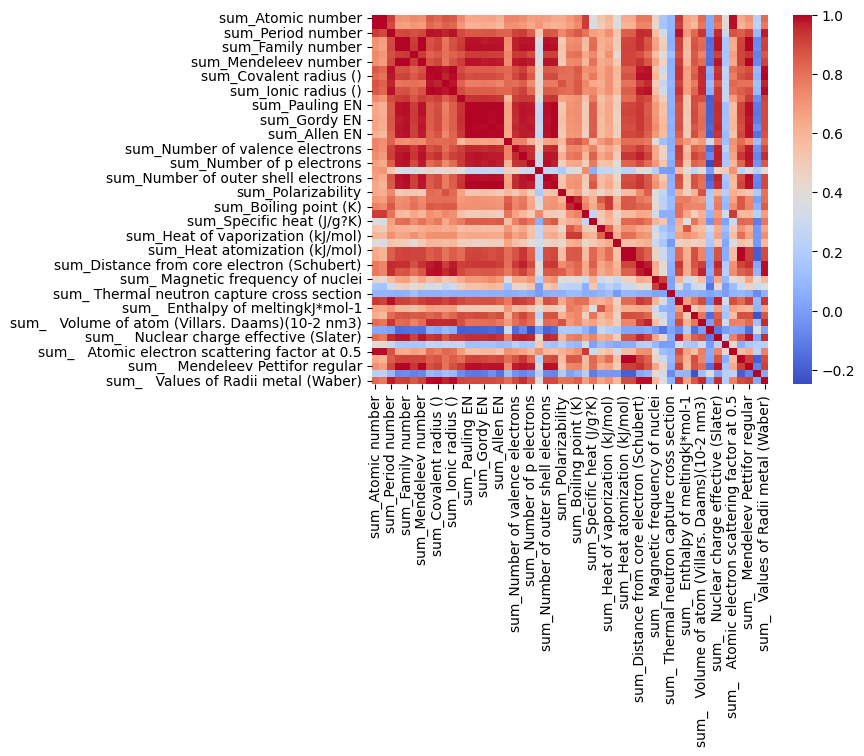

In [4]:
plt.figure()
sns.heatmap(z.corr(), cmap='coolwarm')
plt.show()

I decided to use data that has postive correlations which is the red parts on the top left of the heatmap above.

In [5]:
x = z.iloc[:, :21]  # Select columns 0 to 20 (0-indexed)
y = df['E']
print(x)

branches=x.columns.tolist()
print(branches)

       sum_Atomic number  sum_Atomic weight  sum_Period number  \
0                    108         249.144000                 13   
1                    132         299.784030                 21   
2                    180         421.481418                 23   
3                    568        1176.738400                120   
4                   1120        2342.289544                212   
...                  ...                ...                ...   
21529                328         761.239300                 36   
21530                348         769.926200                 62   
21531                744        1816.048200                 80   
21532                120         250.880418                 24   
21533                342         789.713840                 48   

       sum_Group number  sum_Family number  sum_L quantum number  \
0                    36                 18                     4   
1                    72                 34                     6   
2  

Split the dataset into training and test samples. 20% of the data will be used for testing, while 80% will be used for training the model.

In [6]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=123)

This function creates a matrix of scatter plots, allowing us to examine the pairwise interactions and correlations between different input features. The resulting plot provides insights into the relationships between the features and helps in understanding their potential impact on the target variable (bandgap prediction in this case).

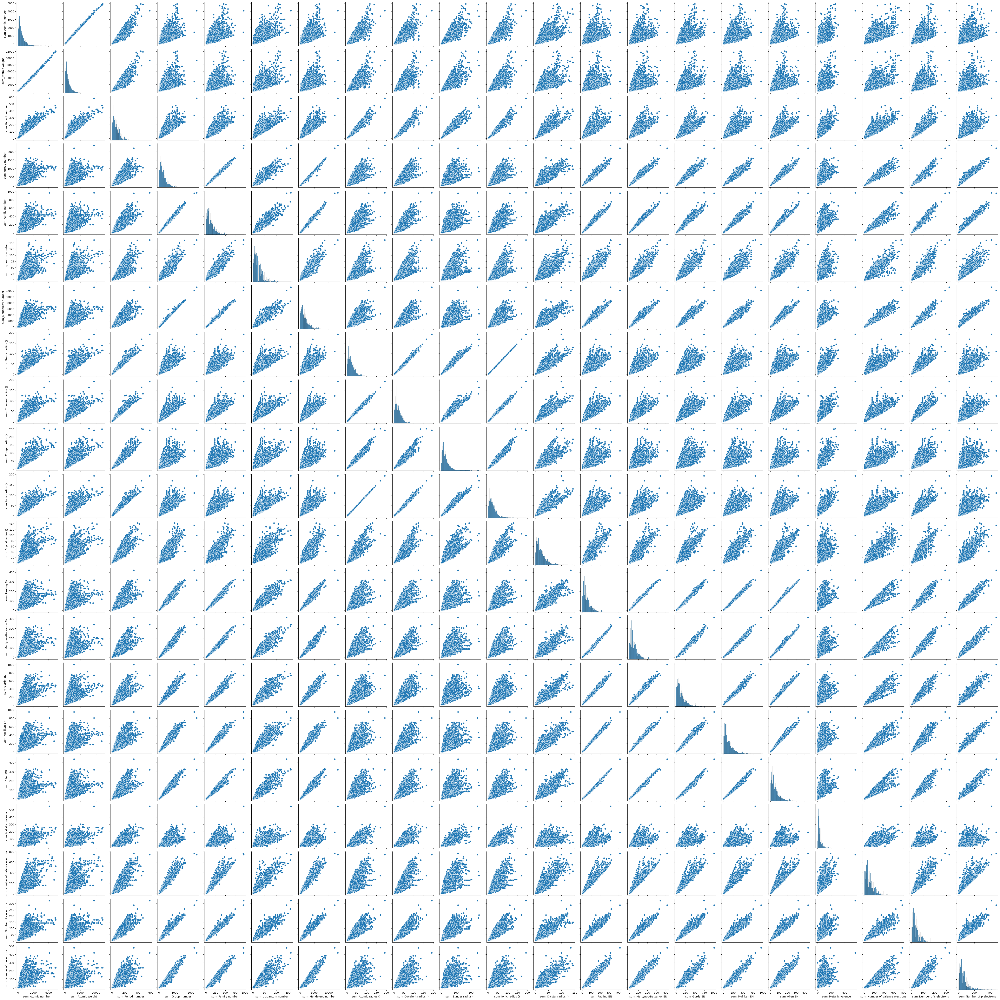

In [7]:
x_train_df = pd.DataFrame(x_train)
sns.pairplot(x_train_df) 

The resulting plots show the correlation between each feature and the target variable 'E'

C:\Users\Jay10\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\seaborn\axisgrid.py:447: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


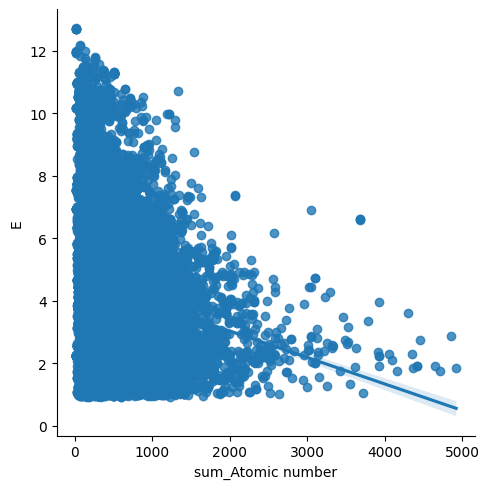

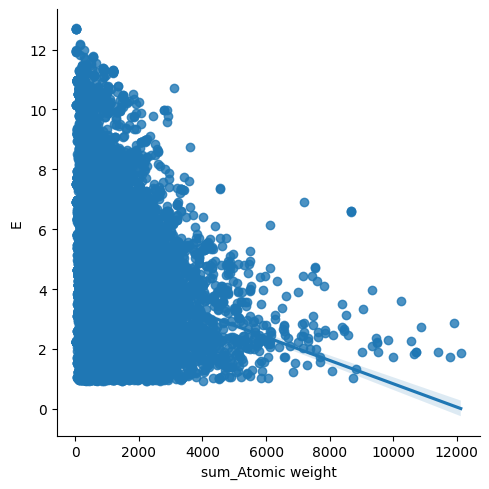

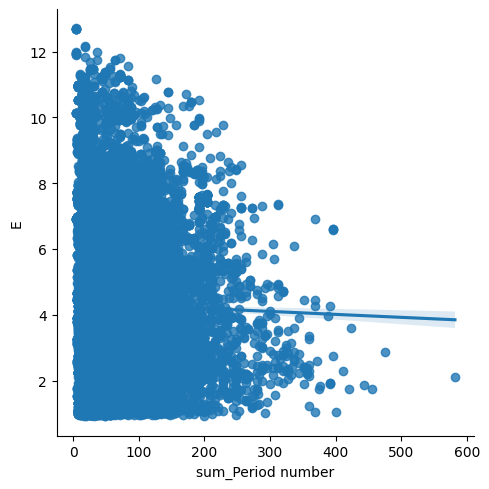

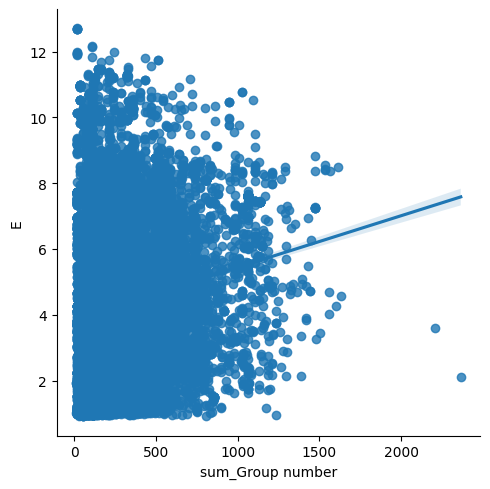

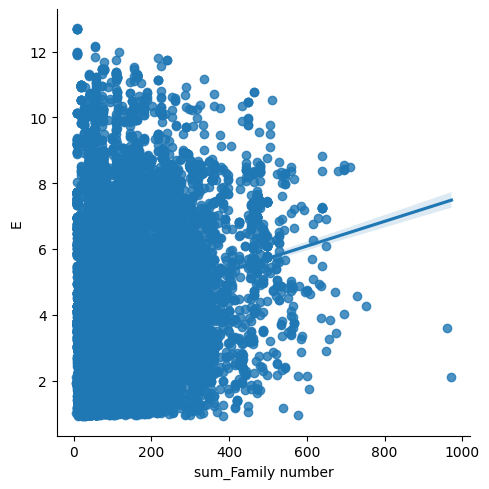

...

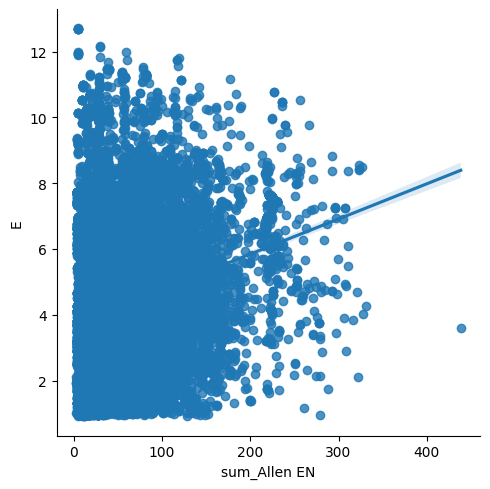

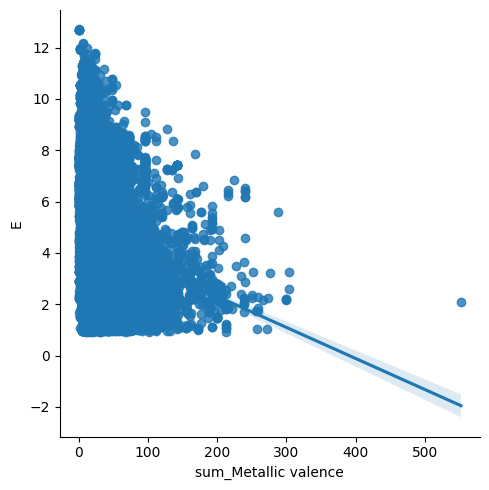

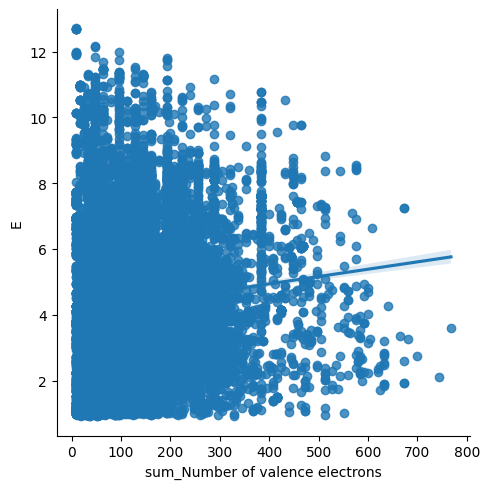

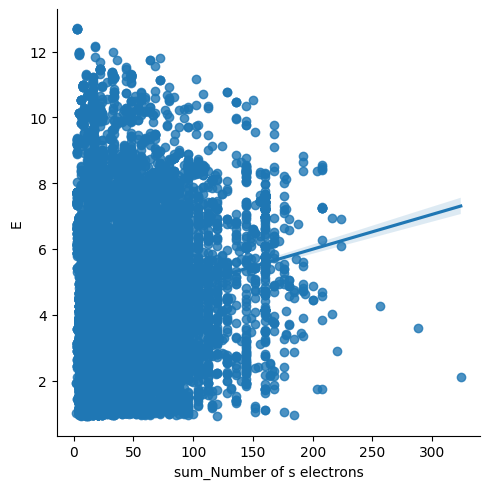

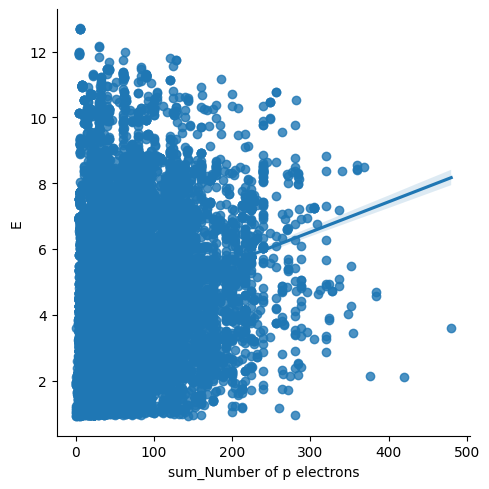

In [8]:
# Iterate through columns in x_train
for column in branches:
    sns.lmplot(x=column, y='E', data=df)

We can examine the input features of our training dataset by creating a mapping of feature names to feature data.

In [9]:
x_train_before_scaling = {}
for b in branches:
    x_train_before_scaling[b] = x_train[b].values.tolist()

 Now plot the data for each feature

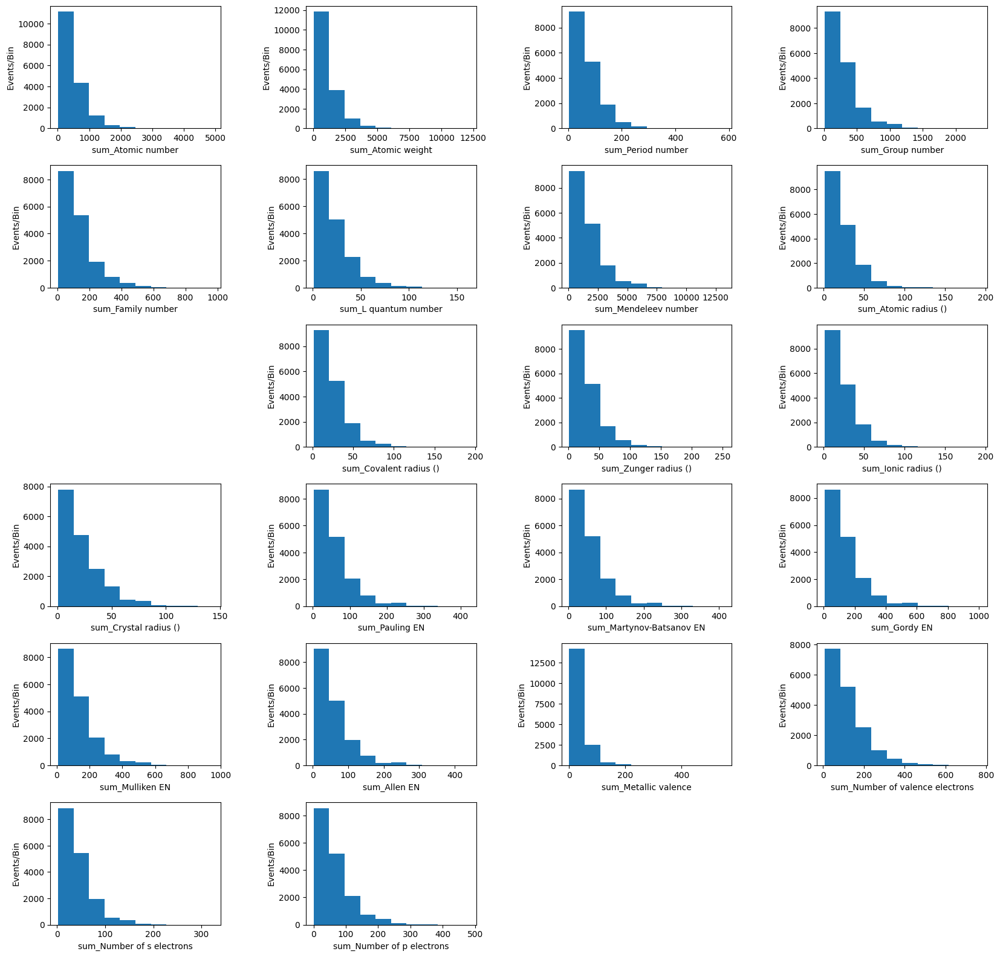

In [10]:
fig = plt.figure(figsize=(20,30))
fig.tight_layout()
for b in range(len(branches)):
    ax=fig.add_subplot(9,4,1+b if b<8 else 2+b)
    plt.subplots_adjust(hspace=0.3,wspace=0.5)
    ax.hist(x_train_before_scaling[branches[b]])
    ax.set_xlabel(branches[b])
    ax.set_ylabel("Events/Bin")

By scaling the features, we ensure that each feature contributes equally to the model's learning process and prevent features with larger scales from dominating the learning process. 

In [11]:
sc = StandardScaler()
x_train = sc.fit_transform(x_train)

Let's make the map for the scaled data so we can look at the data by feature

In [12]:
x_train_after_scaling={}
for b in branches:
    x_train_after_scaling[b]=[event[branches.index(b)] for event in x_train]

 Now re-draw the features after they've been scaled to see what they look like

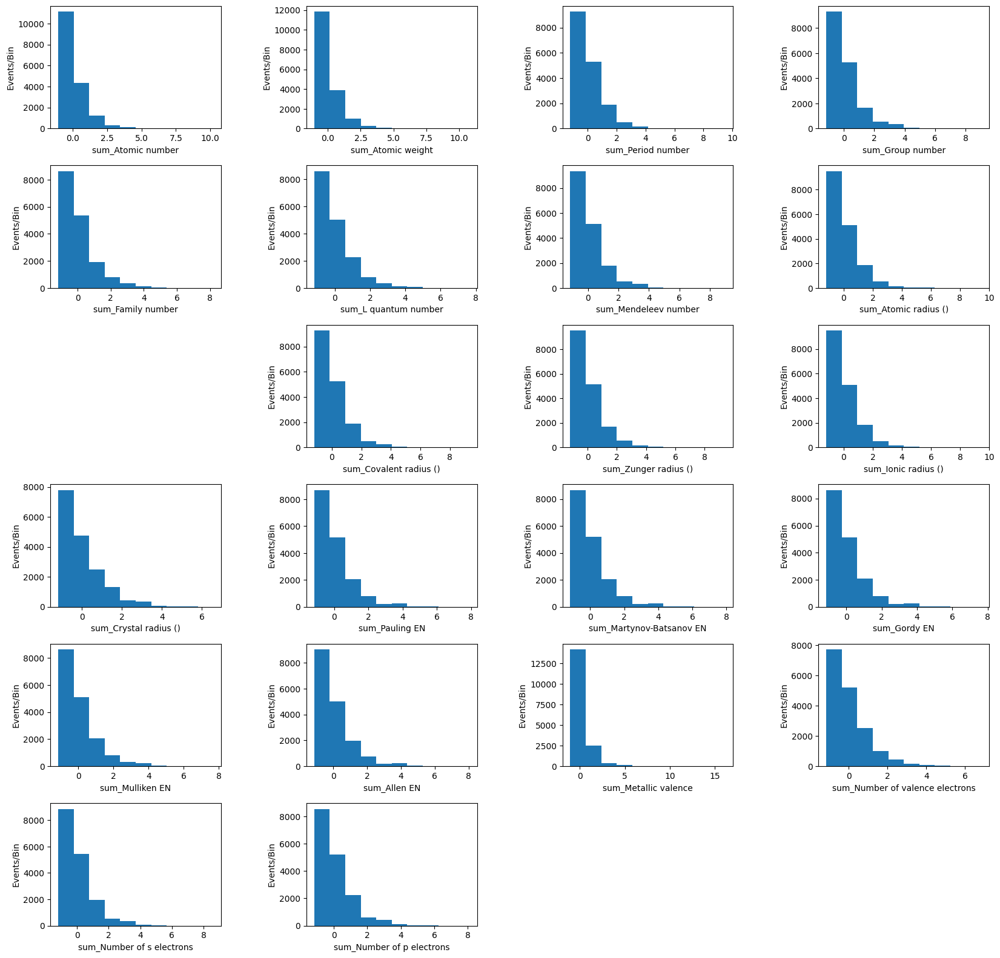

In [13]:
fig = plt.figure(figsize=(20,30))
fig.tight_layout()
for b in range(len(branches)):
    ax=fig.add_subplot(9,4,1+b if b<8 else 2+b)
    plt.subplots_adjust(hspace=0.3,wspace=0.5)
    ax.hist(x_train_after_scaling[branches[b]])
    ax.set_xlabel(branches[b])
    ax.set_ylabel("Events/Bin")

After scaling the training data, we need to apply the same transformation to the test data using the sc object we created earlier, ensuring consistency in the scaling process.

In [14]:
x_test = sc.transform (x_test)

# Network
Starting by converts the numpy arrays of the training and test data into PyTorch tensors

In [15]:
x_train_tensor = torch.tensor(x_train, dtype=torch.float)
y_train_tensor = torch.tensor(y_train.values.reshape(-1, 1), dtype=torch.float)
x_test_tensor = torch.tensor(x_test, dtype=torch.float)
y_test_tensor = torch.tensor(y_test.values.reshape(-1, 1), dtype=torch.float)

Defines the neural network architecture using the Sequential module from the torch.nn library. The network has 21 input features, two hidden layers with 32 nodes each, and an output layer with a single node.

In [16]:
input_size = x_train_tensor.shape[1]

from tqdm import tqdm
net = nn.Sequential(
    nn.Linear(input_size, 32),
    nn.ReLU(),
    nn.Linear(32, 32),
    nn.ReLU(),
    nn.Linear(32, 1)
)

# Parameters
Uses the loss function (Mean Squared Error) and optimizer (Adam) with learning rate of 0.001 for training the network.

In [17]:
loss_fn = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)

Creates a DataLoader to efficiently load the training data in batches during training.

In [18]:
train_dataset = data.TensorDataset(x_train_tensor, y_train_tensor)
train_loader = data.DataLoader(train_dataset, batch_size=int(len(x_train) / 5), shuffle=True)

# Execution
This code trains a neural network model using the training data. It iterates over 1000 epochs, calculates the loss, and updates the model's parameters using the optimizer. The training and test losses are recorded for each epoch.

  1%|█▏                                                                                                                    | 2/202 [00:00<00:32,  6.08it/s]

Completed epoch 1, Train loss: 1.7081e+01, Test loss: 2.2255e+01


 50%|██████████████████████████████████████████████████████████▌                                                         | 102/202 [00:22<00:18,  5.35it/s]

Completed epoch 101, Train loss: 3.8699e-02, Test loss: 2.8573e+00


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 202/202 [00:44<00:00,  4.58it/s]

Completed epoch 201, Train loss: 5.8364e+00, Test loss: 2.6601e+00


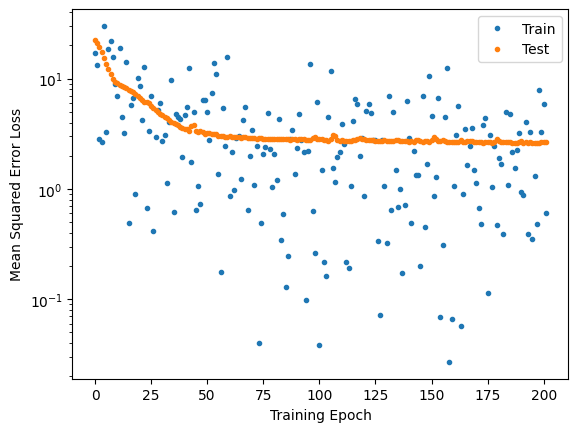

In [19]:
losses = []
losses_test = []

torch.manual_seed(123)
net.train()
for epoch in tqdm(range(202)):  
    for x_batch, y_batch in train_loader:
        optimizer.zero_grad()
        y_pred = net(x_batch)
        loss = loss_fn(y_pred, y_batch)
        loss.backward()
        optimizer.step()

    losses.append(loss.item())
    
    net.eval()
    with torch.no_grad():
        y_pred_train = net(x_train_tensor)
        y_pred_test = net(x_test_tensor)
        test_loss = loss_fn(y_pred_test, y_test_tensor)
        losses_test.append(test_loss.item())
    if epoch % 100 == 0:
        print(f"Completed epoch {epoch+1}, Train loss: {loss.item():.4e}, Test loss: {test_loss.item():.4e}")

# Plot the losses
plt.plot(losses, '.', label="Train")
plt.plot(losses_test, '.', label="Test")
plt.legend()
plt.xlabel('Training Epoch')
plt.ylabel('Mean Squared Error Loss')
plt.yscale('log')
plt.show()

Based on the Loss graph, I include features with negative correlation in the dataset to help improving model accuracy by introducing diverse information.

In [20]:
new_x=z
new_y=df['E']

new_branches=new_x.columns.tolist()
print(new_branches)
print(len(new_branches))
print(new_x.info())
print(new_x.head())

['sum_Atomic number', 'sum_Atomic weight', 'sum_Period number', 'sum_Group number', 'sum_Family number', 'sum_L quantum number', 'sum_Mendeleev number', 'sum_Atomic radius ()', 'sum_Covalent radius ()', 'sum_Zunger radius ()', 'sum_Ionic radius ()', 'sum_Crystal radius ()', 'sum_Pauling EN', 'sum_Martynov-Batsanov EN', 'sum_Gordy EN', 'sum_Mulliken EN', 'sum_Allen EN', 'sum_Metallic valence', 'sum_Number of valence electrons', 'sum_Number of s electrons', 'sum_Number of p electrons', 'sum_Number of d electrons', 'sum_Number of outer shell electrons', 'sum_First ionization energy (kJ/mol)', 'sum_Polarizability', 'sum_Melting point (K)', 'sum_Boiling point (K)', 'sum_Density (g/mL)', 'sum_Specific heat (J/g?K)', 'sum_Heat of fusion (kJ/mol)', 'sum_Heat of vaporization (kJ/mol)', 'sum_Thermal conductivity (W/mK)', 'sum_Heat atomization (kJ/mol)', 'sum_Cohesive energy (eV)', 'sum_Distance from core electron (Schubert)', 'sum_ Distance from valence electron (Schubert)', 'sum_ Magnetic frequ

  0%|▌                                                                                                                     | 1/202 [00:00<00:38,  5.24it/s]

Completed epoch 1, Train loss: 1.5622e+01, Test loss: 2.0569e+01


 50%|██████████████████████████████████████████████████████████                                                          | 101/202 [00:22<00:20,  4.87it/s]

Completed epoch 101, Train loss: 8.7463e-02, Test loss: 2.6819e+00


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 201/202 [00:46<00:00,  4.33it/s]

Completed epoch 201, Train loss: 9.7302e+00, Test loss: 2.2911e+00


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 202/202 [00:46<00:00,  4.33it/s]


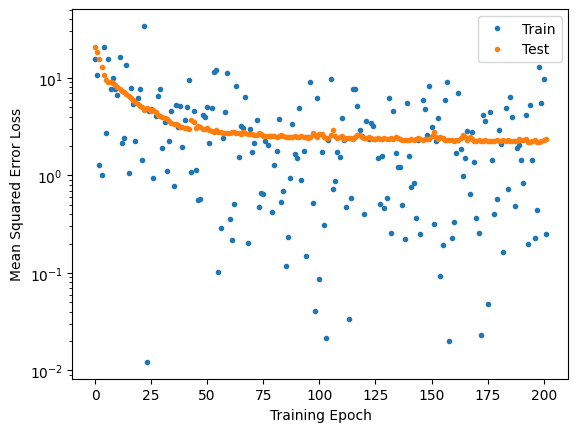

In [21]:
new_x_train, new_x_test, new_y_train, new_y_test = train_test_split(new_x, new_y, test_size=0.2, random_state=123)
sc = StandardScaler()
new_x_train = sc.fit_transform(new_x_train)
new_x_test = sc.transform (new_x_test)
new_x_train_tensor = torch.tensor(new_x_train, dtype=torch.float)
new_y_train_tensor = torch.tensor(new_y_train.values.reshape(-1, 1), dtype=torch.float)
new_x_test_tensor = torch.tensor(new_x_test, dtype=torch.float)
new_y_test_tensor = torch.tensor(new_y_test.values.reshape(-1, 1), dtype=torch.float)

new_input_size = new_x_train_tensor.shape[1]

from tqdm import tqdm
net = nn.Sequential(
    nn.Linear(new_input_size, 64),
    nn.ReLU(),
    nn.Linear(64, 32),
    nn.ReLU(),
    nn.Linear(32, 1)
)

loss_fn = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)
new_train_dataset = data.TensorDataset(new_x_train_tensor, new_y_train_tensor)
new_train_loader = data.DataLoader(new_train_dataset, batch_size=int(len(new_x_train) / 5), shuffle=True)
losses = []
losses_test = []

torch.manual_seed(123)
net.train()
for epoch in tqdm(range(202)):  
    for x_batch, y_batch in new_train_loader:
        optimizer.zero_grad()
        y_pred = net(x_batch)
        loss = loss_fn(y_pred, y_batch)
        loss.backward()
        optimizer.step()

    losses.append(loss.item())
    
    net.eval()
    with torch.no_grad():
        new_y_pred_train = net(new_x_train_tensor)
        new_y_pred_test = net(new_x_test_tensor)
        test_loss = loss_fn(new_y_pred_test, new_y_test_tensor)
        losses_test.append(test_loss.item())
    if epoch % 100 == 0:
        print(f"Completed epoch {epoch+1}, Train loss: {loss.item():.4e}, Test loss: {test_loss.item():.4e}")

# Plot the losses
plt.plot(losses, '.', label="Train")
plt.plot(losses_test, '.', label="Test")
plt.legend()
plt.xlabel('Training Epoch')
plt.ylabel('Mean Squared Error Loss')
plt.yscale('log')
plt.show()